# Chemical space and its visualization
In previous exercises, we have obtained skills to work with molecules as objects in Python and calculate various descriptors for them. Now, we will use these "numbers" to visualize [Chemical space](https://en.wikipedia.org/wiki/Chemical_space) of our ligands and drugs. You surely heard about it in lectures. Simply said, when we have numbers, we can project them into some plot. However, 1024 dimensional space of fingerprints is too much to find there anything reasonable. As mind exercise, try to imagine 4D or 5D plot. Nontheless, in this exercise, we will prepare some maps for our compounds. We will use some descriptors, fingerprints and to reduce number of dimensions [PCA](https://en.wikipedia.org/wiki/Principal_component_analysis), [MDS](https://en.wikipedia.org/wiki/Multidimensional_scaling) and [t-SNE](https://en.wikipedia.org/wiki/T-distributed_stochastic_neighbor_embedding). These tools are pretty popular and you can easily find many articles. And yes, we use them too.

So what will we need to visualize our data? Of course RDKit and something to plot (Seaborn, Matplotlib or whatever you want). Something to work with our number space, I use scikit-learn and with it we will also train model.

## Goals of the exercise
* Familiarize yourself with visualization methods. If mentioned methods in this exercise are not enough you can surely find more methods in scikit-learn. You can see that the methods work but you should understand what they do, may be you can't use them for your data.
* Try to visualize some features of your compounds such as activity, number of carbons, rings etc.
* Show if your compounds with same scaffold are close on your map(s)

## Installing necessary tools and packages

In [28]:
# rdkit mols are displayed as images
from rdkit.Chem.Draw import IPythonConsole

from rdkit.Chem import AllChem as Chem
from rdkit import DataStructs

# descriptors
from rdkit.Chem import Lipinski
from rdkit.Chem import rdMolDescriptors
from rdkit.Chem import Descriptors

# diversity picker
from rdkit.SimDivFilters.rdSimDivPickers import MaxMinPicker

# plots
from matplotlib import pyplot as plt
import seaborn as sns

# scikit learn
# conda install -c conda-forge scikit-learn 
from scipy.spatial import distance
from sklearn import manifold
from sklearn import decomposition
from sklearn import preprocessing

# other packages
import pandas as pd
import csv
import re

## Data preparation

In [32]:
# let's use re module to select valid floats
float_pattern = re.compile("[0-9]+(\.[0-9]*)?")

In [33]:
# Lipinski's descriptors function
lip_func = [("HBA", Lipinski.NumHAcceptors), ("HBD", Lipinski.NumHDonors), ("MW", Descriptors.ExactMolWt),
            ("LogP", Descriptors.MolLogP), ("TPSA", rdMolDescriptors.CalcTPSA), ("RB", Lipinski.NumRotatableBonds)]

In [34]:
# loading data, we want to remember source of data and pChEMBLE value (it's transfomed compound activity to "standard" value)
with open("Cytochrome_P450_targets.csv") as inp:
    cytcc = [row for row in csv.DictReader(inp, delimiter=";", quotechar='"')]
    for cytc in cytcc:
        cytc["rdmol"] = Chem.MolFromSmiles(cytc["Smiles"])
        cytc["source"] = "Cytochrome P450"
        cytc["pChEMBL_value"] = float(cytc["pChEMBL Value"]) if float_pattern.match(cytc["pChEMBL Value"]) else 0
        cytc["fps"] = Chem.GetMorganFingerprintAsBitVect(cytc["rdmol"],2,nBits=1024)
        for f in lip_func:
            cytc[f[0]] = f[1](cytc["rdmol"])
            
cytcc[:1]

[OrderedDict([('Molecule ChEMBL ID', 'CHEMBL3109802'),
              ('Molecule Name', 'TBA-7371'),
              ('Molecule Max Phase', '2'),
              ('Molecular Weight', '355.40'),
              ('#RO5 Violations', '0'),
              ('AlogP', '1.22'),
              ('Compound Key', '12'),
              ('Smiles', 'COc1ncnc(Cn2cc(C(=O)NCCO)c3ncc(C)cc32)c1C'),
              ('Standard Type', 'IC50'),
              ('Standard Relation', "'>'"),
              ('Standard Value', '50000.0'),
              ('Standard Units', 'nM'),
              ('pChEMBL Value', ''),
              ('Data Validity Comment', ''),
              ('Comment', ''),
              ('Uo Units', 'UO_0000065'),
              ('Ligand Efficiency BEI', ''),
              ('Ligand Efficiency LE', ''),
              ('Ligand Efficiency LLE', ''),
              ('Ligand Efficiency SEI', ''),
              ('Potential Duplicate', 'True'),
              ('Assay ChEMBL ID', 'CHEMBL3292128'),
              ('Assay Desc

In [35]:
%%capture
# %%capture hides stderr (and maybe all output)
# same for drugbank
drugbank = [{"rdmol": cytc,
             "source": "drugbank",
             "Smiles": Chem.MolToSmiles(cytc),
             "pChEMBL_value": 0,
             "fps": Chem.GetMorganFingerprintAsBitVect(cytc, 2, nBits=1024),
             **{f[0]: f[1](cytc) for f in lip_func}
            } for cytc in Chem.SDMolSupplier("../data/drugbank.sdf") if cytc
           ]

In [36]:
# let's work with Pandas dataframe
df = pd.DataFrame((*drugbank, *cytcc), columns=["Smiles", "source", "rdmol", "fps", "pChEMBL_value", *(f[0] for f in lip_func)])
# adds index as normal column
df.reset_index(level=0, inplace=True)
df.head()

,index,Smiles,source,rdmol,fps,pChEMBL_value,HBA,HBD,MW,LogP,TPSA,RB
0,0,CC[C@H](C)[C@H](NC(=O)[C@H](CCC(=O)O)NC(=O)[C@...,drugbank,<rdkit.Chem.rdchem.Mol object at 0x7fd343082c60>,"[0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",0.0,29,28,2178.985813,-8.11643,901.57,66
1,1,CC(C)C[C@H](NC(=O)[C@@H](COC(C)(C)C)NC(=O)[C@H...,drugbank,<rdkit.Chem.rdchem.Mol object at 0x7fd343082b20>,"[0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",0.0,16,17,1268.641439,-3.10570,495.89,31
2,2,N=C(N)NCCC[C@H](NC(=O)[C@@H]1CCCN1C(=O)[C@@H]1...,drugbank,<rdkit.Chem.rdchem.Mol object at 0x7fd343082b70>,"[0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, ...",0.0,15,14,1068.426955,-4.13203,435.41,19
3,3,CC(=O)N[C@H](Cc1ccc2ccccc2c1)C(=O)N[C@H](Cc1cc...,drugbank,<rdkit.Chem.rdchem.Mol object at 0x7fd343082a30>,"[0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",0.0,16,17,1429.669818,-0.50613,495.67,38
4,4,C/C=C/C[C@@H](C)[C@@H](O)[C@H]1C(=O)N[C@@H](CC...,drugbank,<rdkit.Chem.rdchem.Mol object at 0x7fd3430828a0>,"[0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, ...",0.0,12,5,1201.841368,3.26900,278.80,15


## Common plots

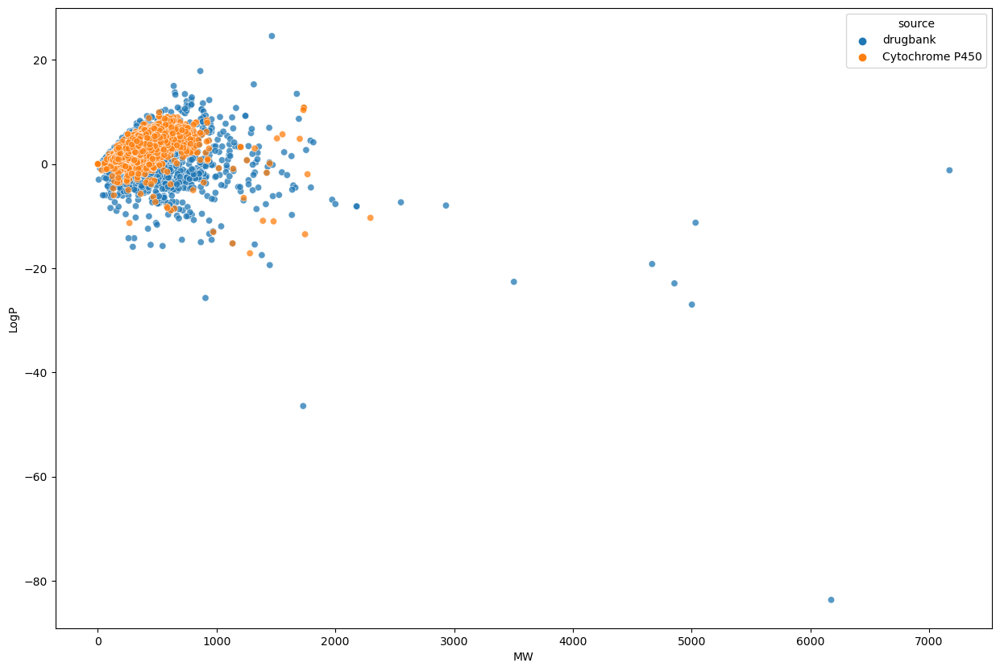

In [37]:
fig, ax = plt.subplots(figsize=(15,10))
p=sns.scatterplot(x="MW",
                      y="LogP",
                      data=df,
                      hue="source",
                      legend="brief",
                      ax=ax,
                      alpha=0.75
                     )
plt.show()

We can see from the plot that most of the molecules from Cytochrome P450 dataset have molecular weight approximately the same as drugbank molecules (around 1000).

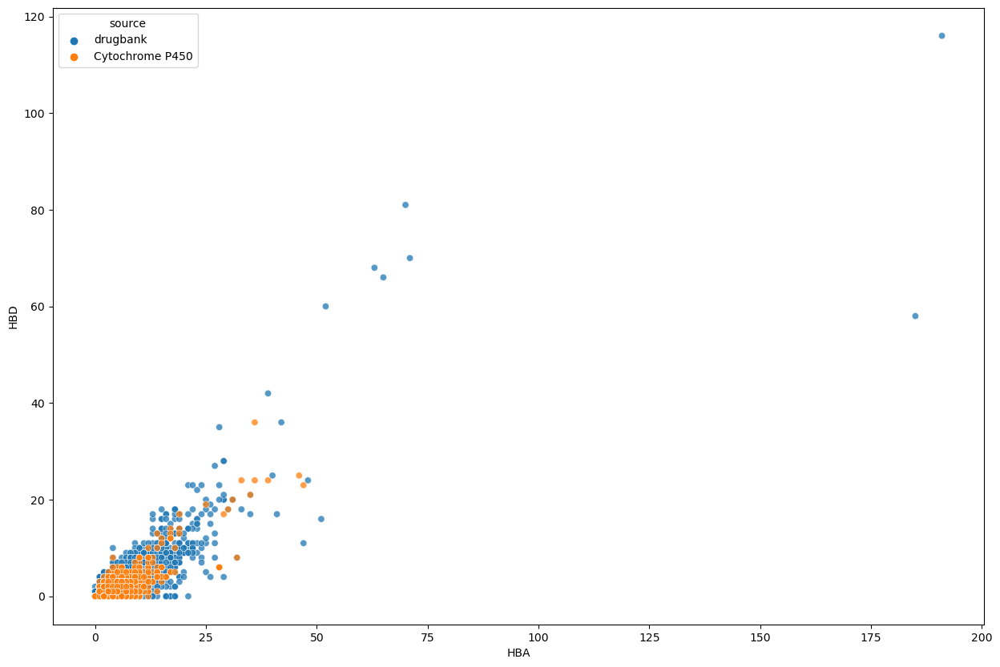

In [40]:
fig, ax = plt.subplots(figsize=(15,10))
p=sns.scatterplot(x="HBA",
                      y="HBD",
                      data=df,
                      hue="source",
                      legend="brief",
                      ax=ax,
                      alpha=0.75
                     )
plt.show()

## MQNs - Molecular Quantum Numbers

In [39]:
df = df.join(pd.DataFrame((rdMolDescriptors.MQNs_(mol) for mol in df["rdmol"]),
                          columns=[*(f"MQN_{x}" for x in range(1,43))])
            )

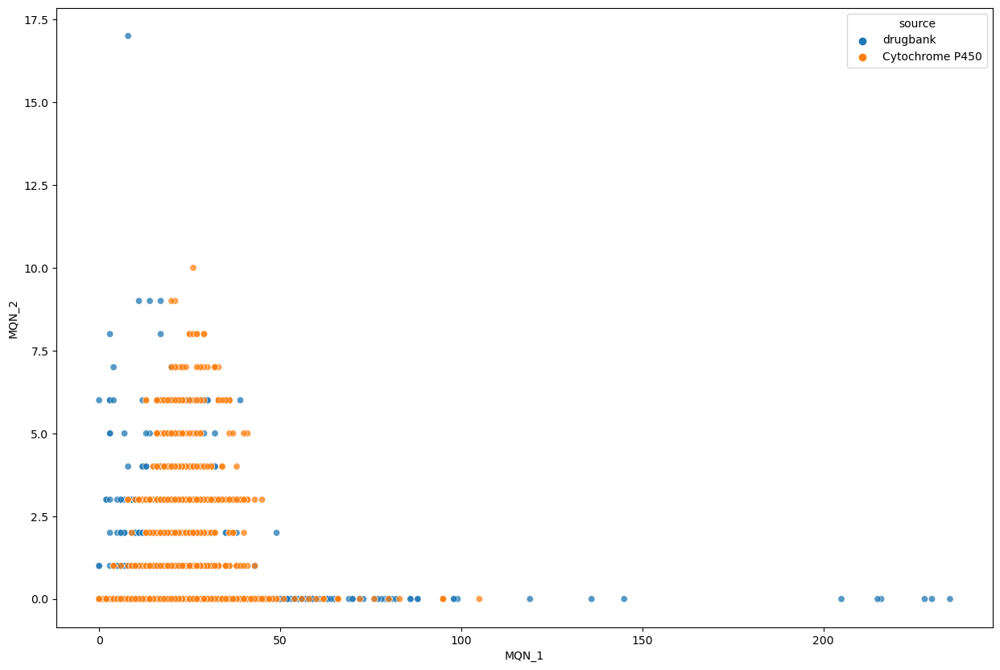

In [41]:
fig, ax = plt.subplots(figsize=(15,10))
p=sns.scatterplot(x="MQN_1",
                      y="MQN_2",
                      data=df,
                      hue="source",
                      legend="brief",
                      ax=ax,
                      alpha=0.75
                     )
plt.show()

## PCA

In [42]:
pca = decomposition.PCA(n_components=42)
pca.fit(df[(f"MQN_{x}" for x in range(1, 43))])
df = df.join(pd.DataFrame(pca.transform(df[(f"MQN_{x}" for x in range(1, 43))]),
                          columns=[f"PCA_{x}" for x in range(1, 43)])
            )


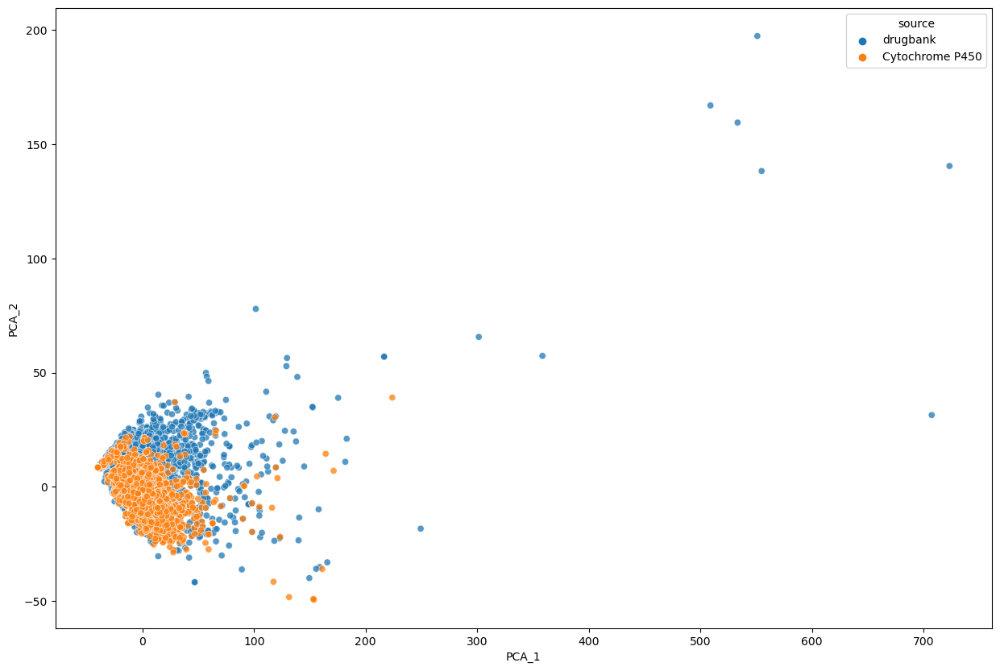

In [43]:
fig, ax = plt.subplots(figsize=(15,10))
p=sns.scatterplot(x="PCA_1", y="PCA_2",
                      data=df,
                      hue="source",
                      legend="brief",
                      ax=ax,
                      alpha=0.75
                     )
plt.show()

### Normalized PCA

In [45]:
norm = preprocessing.normalize(df[(f"MQN_{x}" for x in range(1, 43))])
pca.fit(norm)
df = df.join(pd.DataFrame(pca.transform(norm), columns=[f"nPCA_{x}" for x in range(1, 43)]))

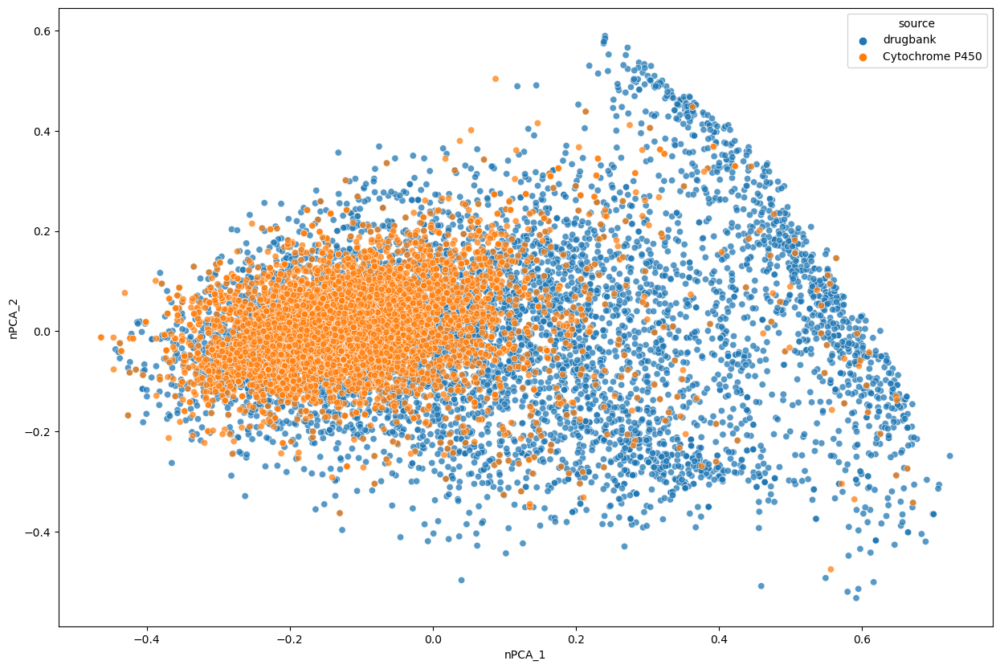

In [47]:
fig, ax = plt.subplots(figsize=(15,10))
p=sns.scatterplot(x="nPCA_1",
                      y="nPCA_2",
                      data=df,
                      hue="source",
                      legend="brief",
                      ax=ax,
                      alpha=0.75
                     )
plt.show()

## MDS
[Multidimensional scaling](https://en.wikipedia.org/wiki/Multidimensional_scaling) puts instances to lower dimensional space (typically 2D/3D). Method is iterative and tries to keep similar distances between points in the original and new spaces. 

In [48]:
sparse_mat = distance.pdist(list(df["fps"]),metric="jaccard")
dist_mat = distance.squareform(sparse_mat)

clf = manifold.MDS(n_components=2, n_init=1, max_iter=100, dissimilarity="precomputed")
X_mds = clf.fit_transform(dist_mat)

In [49]:
df = df.join(pd.DataFrame(X_mds, columns=["mds_x","mds_y"]))

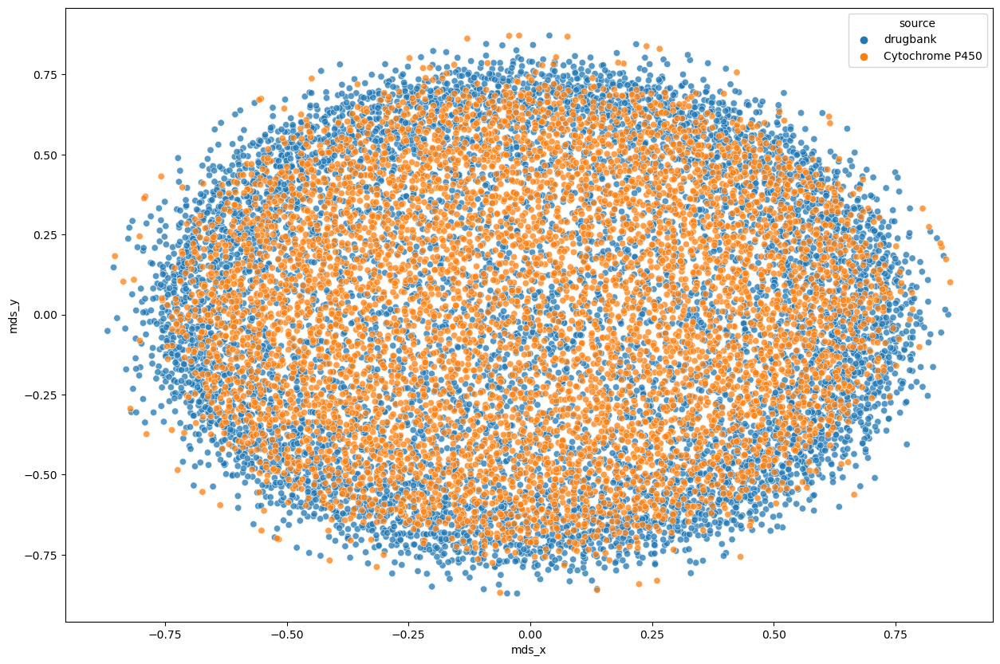

In [51]:
fig, ax = plt.subplots(figsize=(15,10))
p=sns.scatterplot(x="mds_x",
                      y="mds_y",
                      data=df,
                      hue="source",
                      legend="brief",
                      ax=ax,
                      alpha=0.75
                     )
plt.show()

We can see that MDS was not able to separate Cytochrome P450 from drugbank well, with PCA it looked better.

## t-SNE
[t-distributed stochastic neighbor embedding](https://en.wikipedia.org/wiki/T-distributed_stochastic_neighbor_embedding) is another popular method to show similar instances close together and dissimilar far. We can recycle distances calculated for MDS.

In [52]:
clf = manifold.TSNE(n_components=2, metric="precomputed")
X_tsne = clf.fit_transform(dist_mat)

/Users/esimonova/opt/anaconda3/envs/cdd/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:699: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  FutureWarning


In [53]:
df = df.join(pd.DataFrame(X_tsne, columns=["tsne_x", "tsne_y"]))

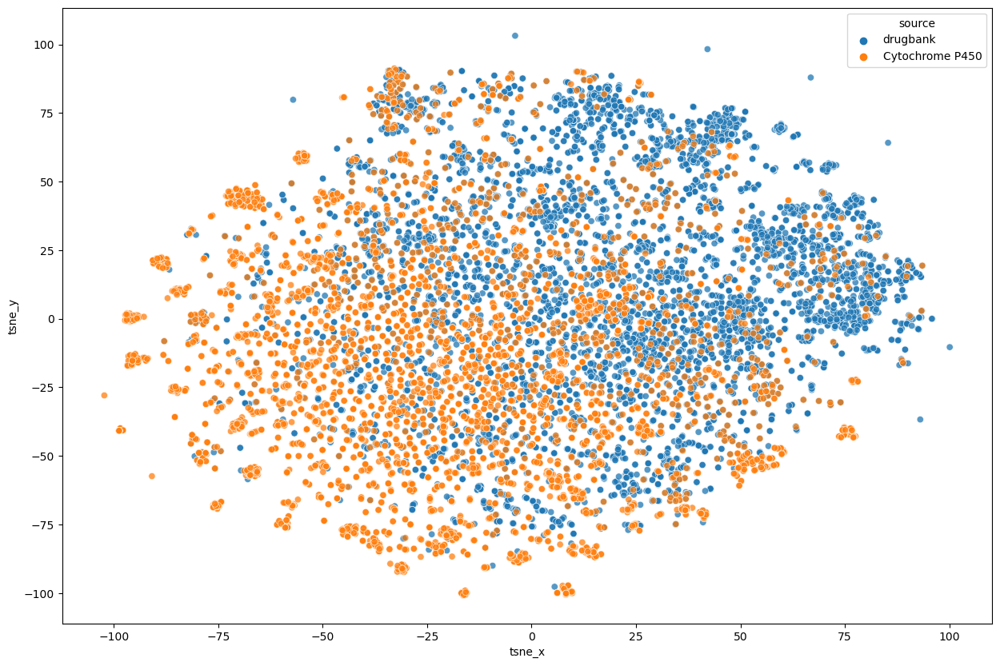

In [55]:
fig, ax = plt.subplots(figsize=(15,10))
p=sns.scatterplot(x="tsne_x",
                      y="tsne_y",
                      data=df,
                      hue="source",
                      legend="brief",
                      ax=ax,
                      alpha=0.75
                     )
plt.show()

t-SNE was not good as well for separation of my dataset from drugbank.

## How can we use it?
### Use case 1: Diversity picker

In [56]:
def distance_function(index1, index2, *args, fingerprints=df["fps"],
                      metric=DataStructs.TanimotoSimilarity):
    return 1 - DataStructs.FingerprintSimilarity(fingerprints[index1],
                                                 fingerprints[index2],
                                                 metric=metric)

In [57]:
picker = MaxMinPicker()
picked = list(picker.LazyPick(distance_function, len(df), 45))
df["picked"] = df.index.isin(picked)

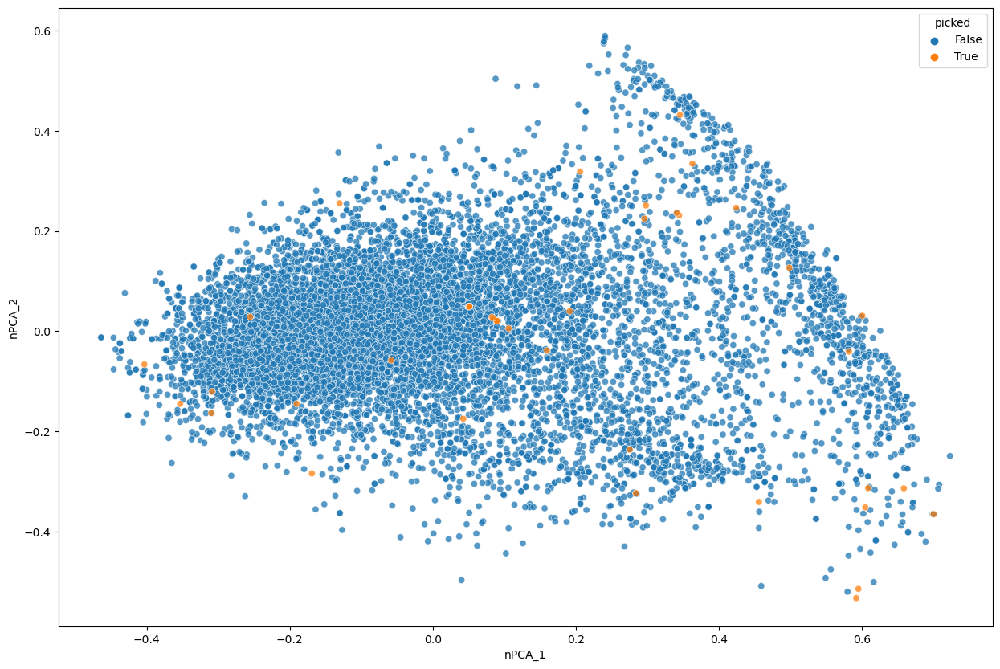

In [67]:
fig, ax = plt.subplots(figsize=(15,10))
p=sns.scatterplot(x="nPCA_1",
                      y="nPCA_2",
                      data=df.sort_values("picked"), # True values are drawn as last so they are better visible 
                      hue="picked",
                      legend="brief",
                      ax=ax,
                      alpha=0.75
                     )
plt.show()

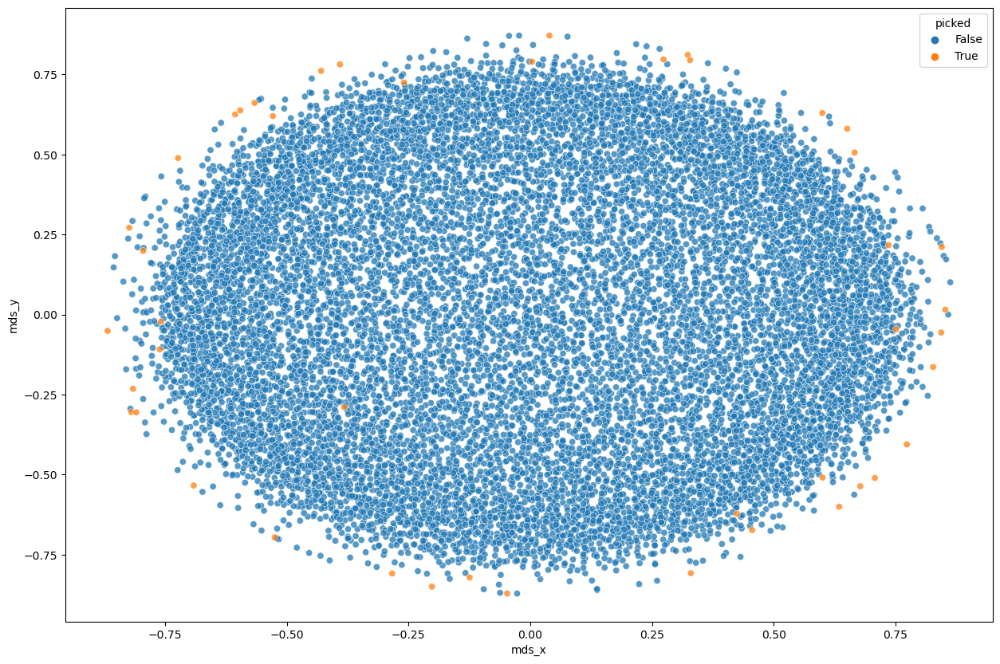

In [68]:
fig, ax = plt.subplots(figsize=(15,10))
p=sns.scatterplot(x="mds_x",
                      y="mds_y",
                      data=df.sort_values("picked"),
                      hue="picked",
                      legend="brief",
                      ax=ax,
                      alpha=0.75
                     )
plt.show()

We can see that MDS was better at visualizing of picked molecules, all of them are concentrated at hte edges of the cluster.

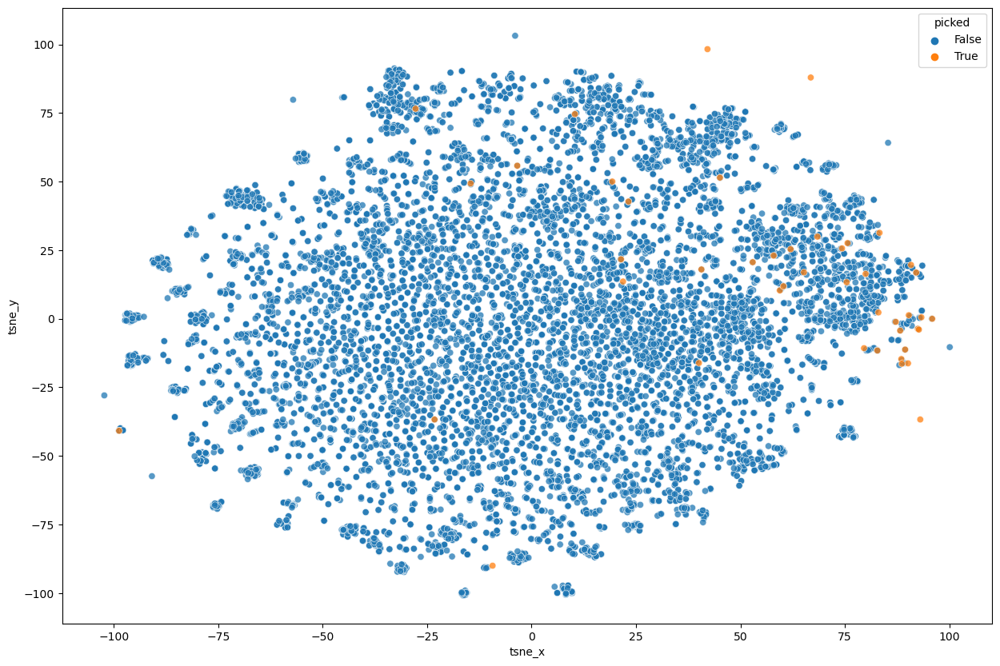

In [64]:
fig, ax = plt.subplots(figsize=(15,10))
p=sns.scatterplot(x="tsne_x",
                      y="tsne_y",
                      data=df.sort_values("picked"),
                      hue="picked",
                      legend="brief",
                      ax=ax,
                      alpha=0.75
                     )
plt.show()

In [ ]:
fig, ax = plt.subplots(figsize=(15,10))
p=sns.scatterplot(x="PCA_1",
                      y="PCA_2",
                      data=df.sort_values("picked"),
                      hue="picked",
                      legend="brief",
                      ax=ax,
                      alpha=0.75
                     )
plt.show()

t-SNE was also good for visualizing of diverse molecules, hoowever MDS was better at it. 

### Use case 2: Activities or descriptors

pChEMBL value allows a number of roughly comparable measures of half-maximal response concentration/potency/affinity to be compared on a negative logarithmic scale. For example, an IC50 measurement of 1nM would have a pChEMBL value of 9. pChEMBL is defined as: -Log(molar IC50, XC50, EC50, AC50, Ki, Kd or Potency). pChEMBL value is good for visualizing the activity of descriptors.

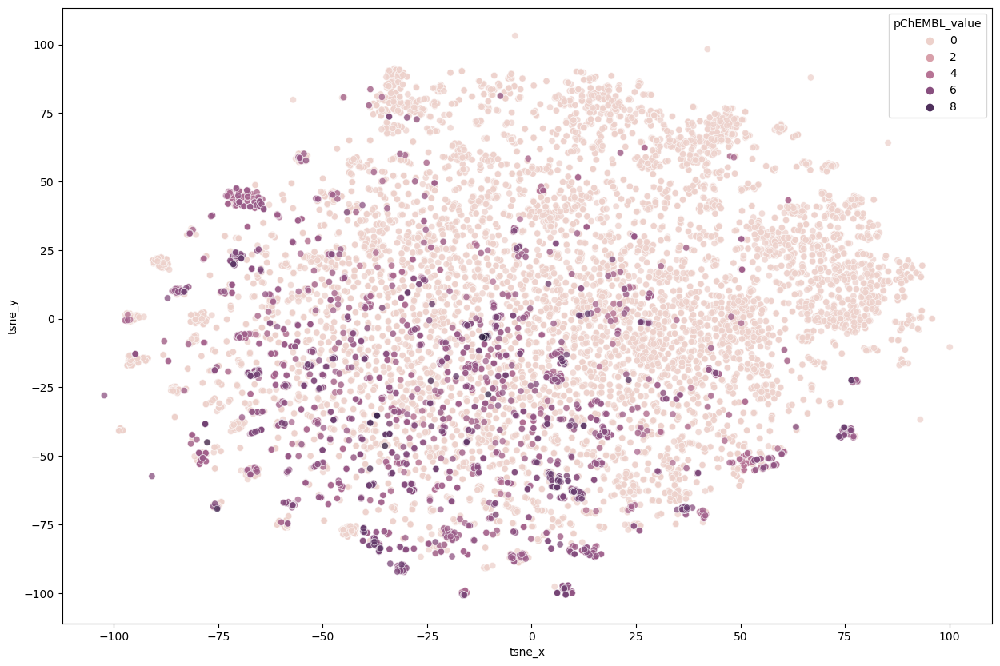

In [69]:
# let's first look on the whole dataset with t-SNE
fig, ax = plt.subplots(figsize=(15,10))
p=sns.scatterplot(x="tsne_x",
                      y="tsne_y",
                      data=df.sort_values("pChEMBL_value"),
                      hue="pChEMBL_value",
                      legend="brief",
                      ax=ax,
                      alpha=0.75
                     )
plt.show()

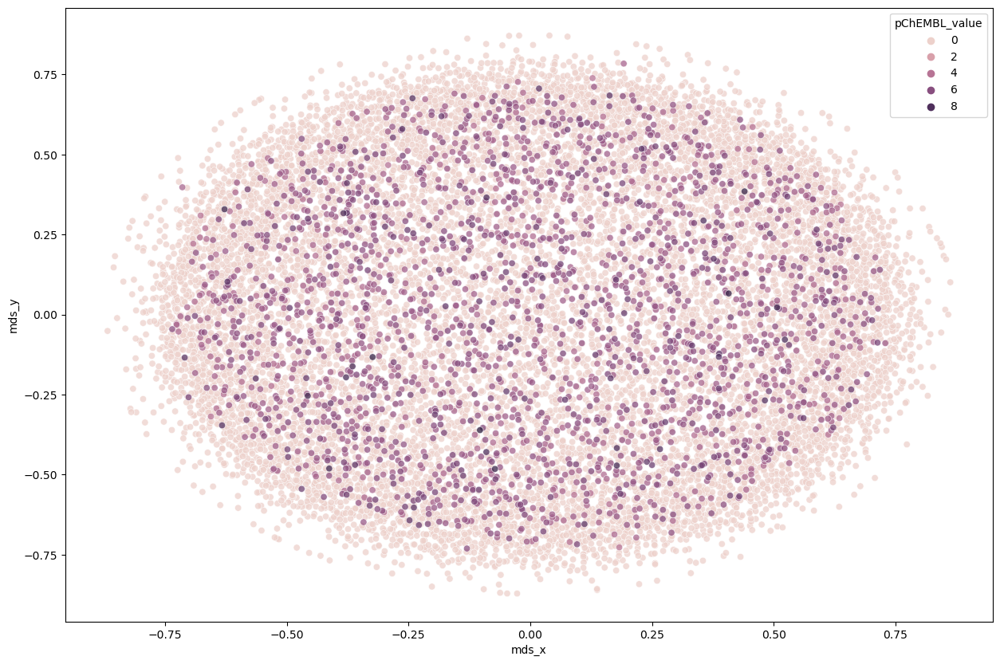

In [70]:
# Now we can look on the whole dataset with MDS
fig, ax = plt.subplots(figsize=(15,10))
p=sns.scatterplot(x="mds_x",
                      y="mds_y",
                      data=df.sort_values("pChEMBL_value"),
                      hue="pChEMBL_value",
                      legend="brief",
                      ax=ax,
                      alpha=0.75
                     )
plt.show()

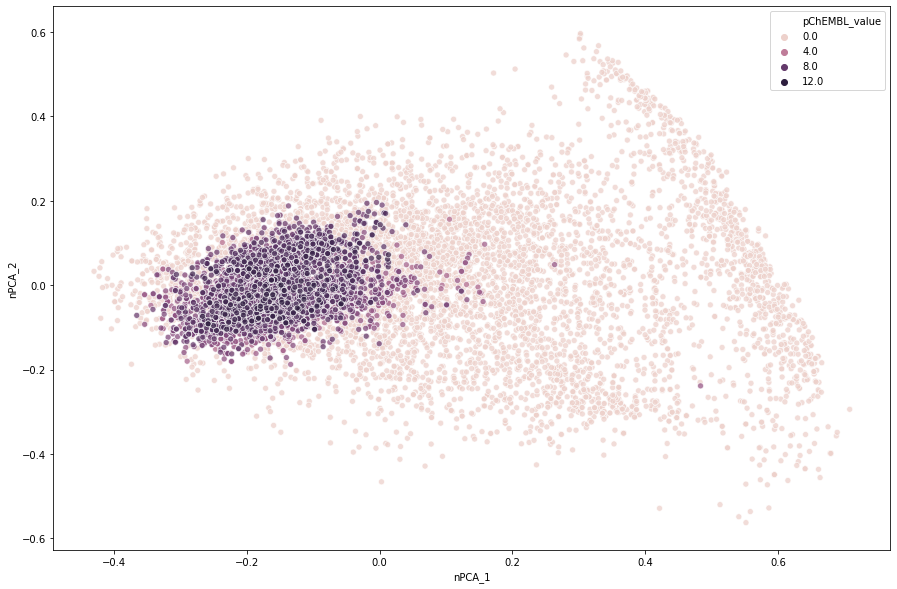

In [29]:
# whole dataset with PCA
fig, ax = pyplot.subplots(figsize=(15,10))
p=seaborn.scatterplot(x="nPCA_1",
                      y="nPCA_2",
                      data=df.sort_values("pChEMBL_value"),
                      hue="pChEMBL_value",
                      legend="brief",
                      ax=ax,
                      alpha=0.75
                     )

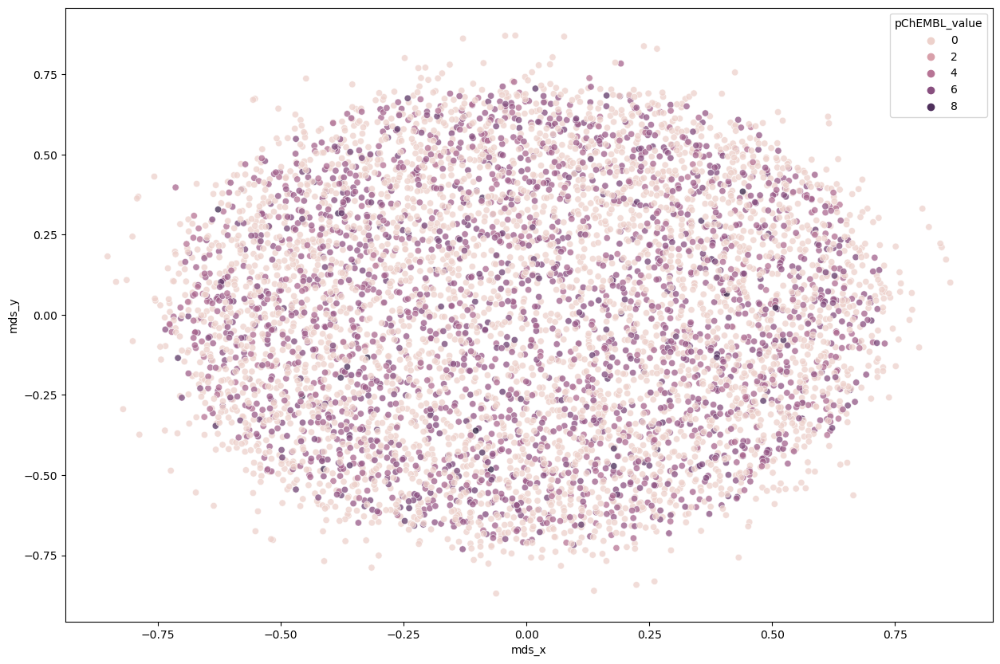

In [71]:
# let's now look only on Cytochrome P450 dataset with MDS
fig, ax = plt.subplots(figsize=(15,10))
p=sns.scatterplot(x="mds_x",
                      y="mds_y",
                      data=df[df.source == "Cytochrome P450"],
                      hue="pChEMBL_value",
                      legend="brief",
                      ax=ax,
                      alpha=0.75
                     )
plt.show()

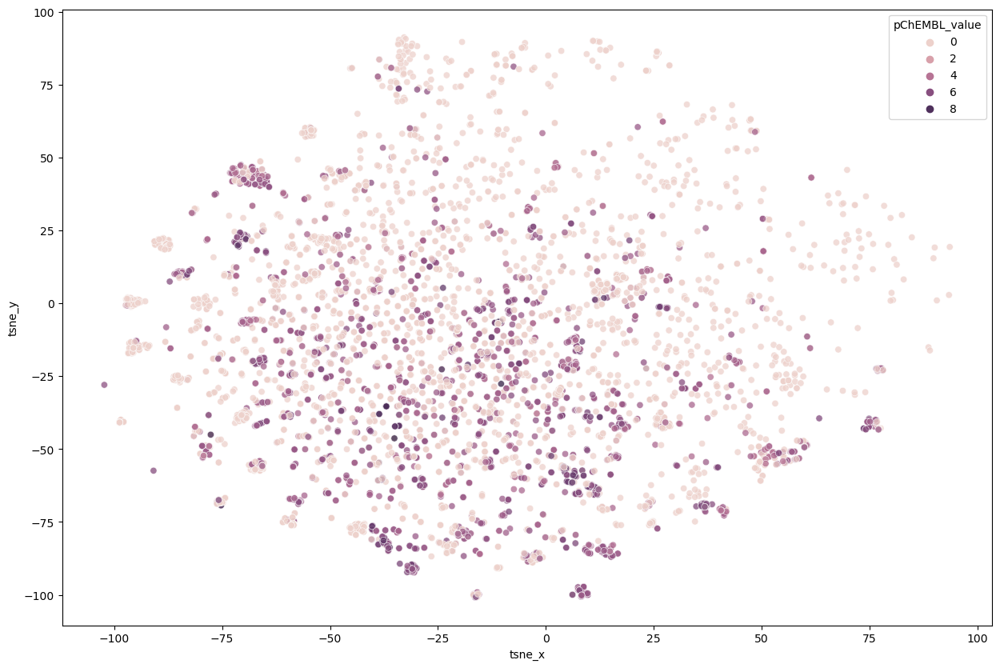

In [72]:
# let's now look only on Cytochrome P450 dataset with t-SNE
fig, ax = plt.subplots(figsize=(15,10))
p=sns.scatterplot(x="tsne_x",
                      y="tsne_y",
                      data=df[df.source == "Cytochrome P450"],
                      hue="pChEMBL_value",
                      legend="brief",
                      ax=ax,
                      alpha=0.75
                     )
plt.show()

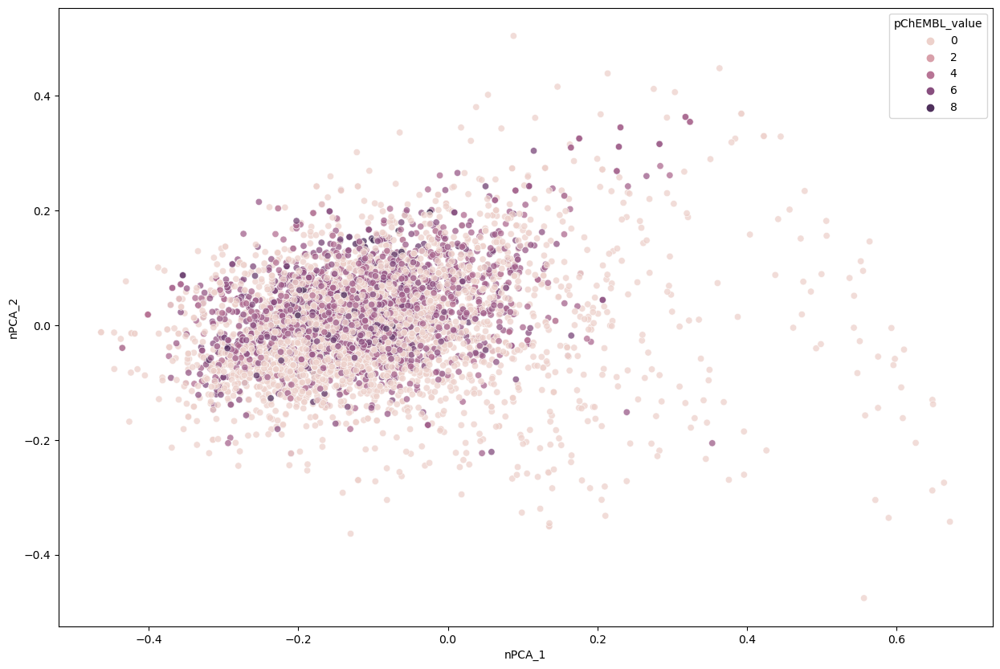

In [73]:
# let's now look only on Cytochrome P450 dataset with PCA
fig, ax = plt.subplots(figsize=(15,10))
p=sns.scatterplot(x="nPCA_1",
                      y="nPCA_2",
                      data=df[df.source == "Cytochrome P450"],
                      hue="pChEMBL_value",
                      legend="brief",
                      ax=ax,
                      alpha=0.75
                     )
plt.show()

## Conclusion

In this these exercise I learned how to:

* do explaratary data analysis of my dataset via seaborn and matplotlib
* perform PCA, normalized PCA, t-SNE and MDS dimentianality reduction technics to explore the data
* visualize activity, number of rings of my compaunds
* visualize and find diverse molecules via RDKit Diversity Picker (based on tanimoto distance between fingerprints)


Regarding to my dataset we can see that there is a diverse activity of compaunds which are able to bind cytochrome P450, the proportion of compaunds with low activity in drugbank is higher than in my dataset.